<a href="https://colab.research.google.com/github/Swathi014/Cognifyz-Internship/blob/main/Task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [123]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import folium

In [124]:
df = pd.read_csv('/content/drive/MyDrive/Internship/Cognifyz/Dataset .csv')
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

#Task 1 : Data Exploration and Preprocessing

In [125]:
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 9551
Number of columns: 21


In [126]:
Missing_values= df.isnull().sum() * 100/len(df)
print("Missing values in each column:")
print(Missing_values)

Missing values in each column:
Restaurant ID           0.000000
Restaurant Name         0.000000
Country Code            0.000000
City                    0.000000
Address                 0.000000
Locality                0.000000
Locality Verbose        0.000000
Longitude               0.000000
Latitude                0.000000
Cuisines                0.094231
Average Cost for two    0.000000
Currency                0.000000
Has Table booking       0.000000
Has Online delivery     0.000000
Is delivering now       0.000000
Switch to order menu    0.000000
Price range             0.000000
Aggregate rating        0.000000
Rating color            0.000000
Rating text             0.000000
Votes                   0.000000
dtype: float64


#Handling Missing Values

In [127]:
df['Cuisines'] = df['Cuisines'].fillna("Unknown")

In [128]:
Missing_values_Cuisines= df['Cuisines'].isnull().sum() * 100/len(df)
Missing_values_Cuisines

0.0

#Perform data type conversion

In [129]:
print("Data types before conversion:")
print(df.dtypes)

Data types before conversion:
Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [130]:
categorical_cols = [
    "Currency", "Has Table booking", "Has Online delivery",
    "Is delivering now", "Switch to order menu", "Rating color", "Rating text"
]
df[categorical_cols] = df[categorical_cols].astype("category")

In [131]:
print("\nUpdated Data Types:\n", df.dtypes)


Updated Data Types:
 Restaurant ID              int64
Restaurant Name           object
Country Code               int64
City                      object
Address                   object
Locality                  object
Locality Verbose          object
Longitude                float64
Latitude                 float64
Cuisines                  object
Average Cost for two       int64
Currency                category
Has Table booking       category
Has Online delivery     category
Is delivering now       category
Switch to order menu    category
Price range                int64
Aggregate rating         float64
Rating color            category
Rating text             category
Votes                      int64
dtype: object


#Analyze the distribution of the target variable & identify any class imbalances.


Aggregate Rating Description:
 count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64


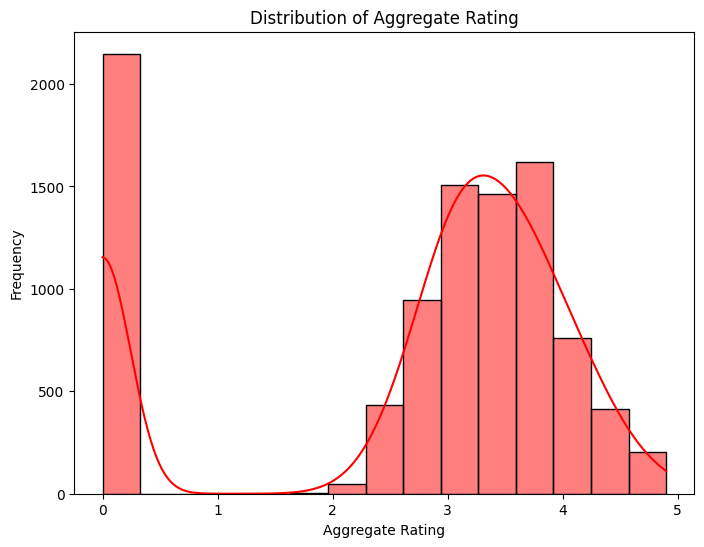

In [132]:
if "Aggregate rating" in df.columns:
    print("\nAggregate Rating Description:\n", df["Aggregate rating"].describe())

    # Visualize the distribution of 'Aggregate rating'
    plt.figure(figsize=(8, 6))
    sns.histplot(df["Aggregate rating"], kde=True, bins=15, color='Red')
    plt.title("Distribution of Aggregate Rating")
    plt.xlabel("Aggregate Rating")
    plt.ylabel("Frequency")
    plt.show()

In [133]:
df['Aggregate rating'].value_counts()

,count
Aggregate rating,
0.0,2148
3.2,522
3.1,519
3.4,498
3.3,483
3.5,480
3.0,468
3.6,458
3.7,427


As we can see,The target variable Aggregate rating has a clear imbalance, with some values (e.g., 0.0) being significantly overrepresented,while others (eg., 1.8, 2.0, 4.8) are extremely rare.

#Task 2: Descriptive Analysis

#Calculate basic statistical measures

In [134]:
statistics = df.describe()
statistics

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


# Median of numerical values

In [135]:
numerical_columns = df.select_dtypes(include=['number'])

numerical_medians = numerical_columns.median()

print("Median Values for Numerical Columns:\n")
print(numerical_medians)


Median Values for Numerical Columns:

Restaurant ID           6.004089e+06
Country Code            1.000000e+00
Longitude               7.719196e+01
Latitude                2.857047e+01
Average Cost for two    4.000000e+02
Price range             2.000000e+00
Aggregate rating        3.200000e+00
Votes                   3.100000e+01
dtype: float64


#distribution of categorical variables

In [136]:
categorical_distributions = {
    "Country Code": df["Country Code"].value_counts(),
    "City": df["City"].value_counts(),
    "Cuisines": df["Cuisines"].value_counts()
}

for i in categorical_distributions:
  print("Value Counts of",categorical_distributions[i])
  print('*'*100)

Value Counts of Country Code
1      8652
216     434
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: count, dtype: int64
****************************************************************************************************
Value Counts of City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
                ... 
Chatham-Kent       1
Bandung            1
Beechworth         1
Armidale           1
Balingup           1
Name: count, Length: 141, dtype: int64
****************************************************************************************************
Value Counts of Cuisines
North Indian                             936
North Indian, Chinese                    511
Fast Food                                354
Chinese                                  354
North Indian, Mughlai                    334
                      

#top cuisines and cities with the highest number of restaurants.

In [137]:
top_cuisines = categorical_distributions["Cuisines"].head(10)
top_cities = categorical_distributions["City"].head(10)

print("\nTop 10 Cuisines:\n")
print(top_cuisines)

print("\nTop 10 Cities with the Highest Number of Restaurants:\n")
print(top_cities)


Top 10 Cuisines:

Cuisines
North Indian                      936
North Indian, Chinese             511
Fast Food                         354
Chinese                           354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Top 10 Cities with the Highest Number of Restaurants:

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Lucknow           21
Guwahati          21
Amritsar          21
Bhubaneshwar      21
Ahmedabad         21
Name: count, dtype: int64


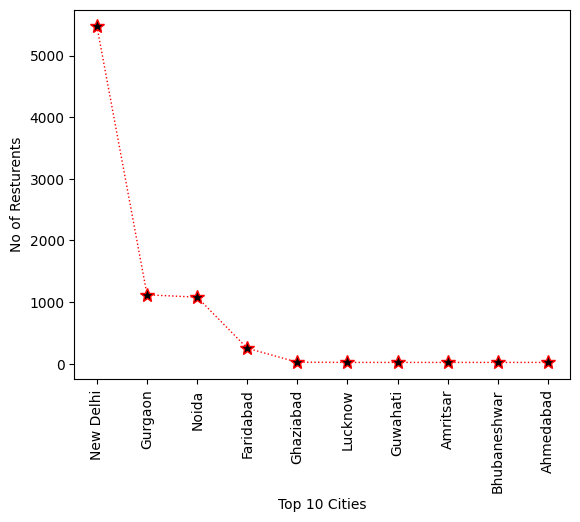

In [138]:
plt.plot(top_cities,color = 'red',linewidth =1, marker = '*',markersize = 10 ,markerfacecolor = 'k' ,linestyle = ':')

plt.xticks(rotation = 90)
plt.xlabel('Top 10 Cities')
plt.ylabel('No of Resturents')
plt.show()

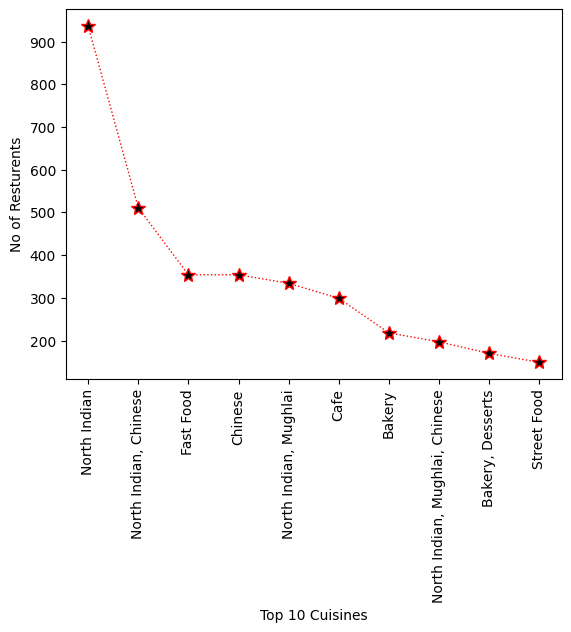

In [139]:
plt.plot(top_cuisines,color = 'red',linewidth =1, marker = '*',markersize = 10 ,markerfacecolor = 'k' ,linestyle = ':')

plt.xticks(rotation = 90)
plt.xlabel('Top 10 Cuisines')
plt.ylabel('No of Resturents')
plt.show()

#Task 3 : Geospatial Analysis

In [140]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Load the dataset


# Initialize a map centered on the average latitude and longitude
center_lat, center_lon = df['Latitude'].mean(), df['Longitude'].mean()
restaurant_map = folium.Map(location=[center_lat, center_lon], zoom_start=2)

# Add restaurant markers to the map using MarkerCluster
marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} (Rating: {row['Aggregate rating']})",
    ).add_to(marker_cluster)

# Save the map as an HTML file
restaurant_map.save('restaurant_locations_map.html')
print("Map saved as restaurant_locations_map.html")

Map saved as restaurant_locations_map.html


In [141]:
restaurant_map

#correlation between the restaurant's location and its rating.

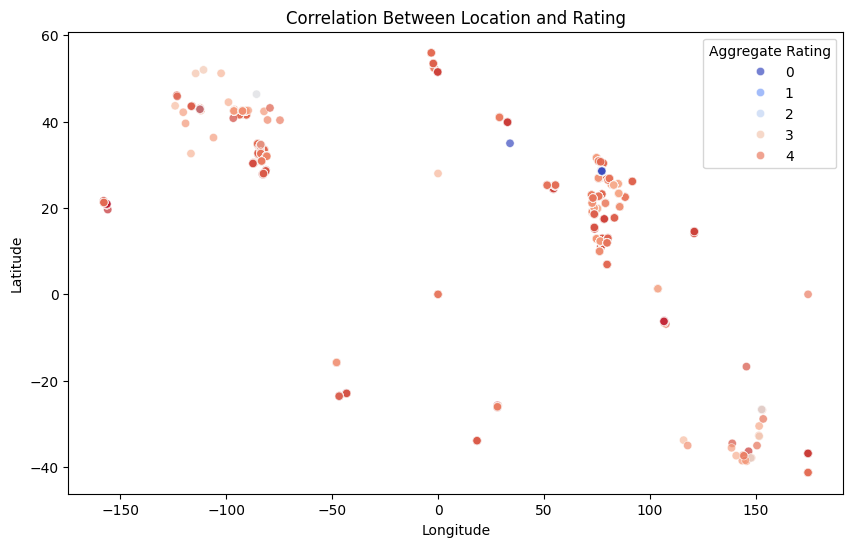

In [142]:
filtered_data = df.dropna(subset=['Latitude', 'Longitude', 'Aggregate rating'])
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x='Longitude', y='Latitude', hue='Aggregate rating', palette='coolwarm', alpha=0.7)
plt.title("Correlation Between Location and Rating")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Aggregate Rating")
plt.show()

# **LEVEL 2**

# Task 1 :Table Booking and Online Delivery

#percentage of restaurants that offer table booking and online delivery.

In [143]:
# percentage of restaurants with table booking
table_booking_percentage = (df['Has Table booking'].value_counts(normalize=True) * 100).to_dict()

# percentage of restaurants with online delivery
online_delivery_percentage = (df['Has Online delivery'].value_counts(normalize=True) * 100).to_dict()

print(f"Percentage of restaurants with table booking: {table_booking_percentage}")
print(f"Percentage of restaurants with online delivery: {online_delivery_percentage}")


Percentage of restaurants with table booking: {'No': 87.87561511883573, 'Yes': 12.124384881164275}
Percentage of restaurants with online delivery: {'No': 74.33776567898649, 'Yes': 25.662234321013504}


#Compare the average ratings of restaurants with table booking and those without

In [144]:
# average rating for restaurants with table booking
avg_rating_with_table_booking = df[df['Has Table booking'] == 'Yes']['Aggregate rating'].mean()

# average rating for restaurants without table booking
avg_rating_without_table_booking = df[df['Has Table booking'] == 'No']['Aggregate rating'].mean()

print(f"Average rating of restaurants with table booking: {avg_rating_with_table_booking:.2f}")
print(f"Average rating of restaurants without table booking: {avg_rating_without_table_booking:.2f}")


Average rating of restaurants with table booking: 3.44
Average rating of restaurants without table booking: 2.56


#Analyze the availability of online delivery among restaurants with different price ranges

In [145]:
# Group the data by price range and calculate the percentage of restaurants with online delivery for each range
online_delivery_by_price_range = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True) * 100

print("\nAvailability of online delivery among different price ranges:")
print(online_delivery_by_price_range)


Availability of online delivery among different price ranges:
Price range  Has Online delivery
1            No                     84.225923
             Yes                    15.774077
2            No                     58.689367
             Yes                    41.310633
3            No                     70.809659
             Yes                    29.190341
4            No                     90.955631
             Yes                     9.044369
Name: proportion, dtype: float64


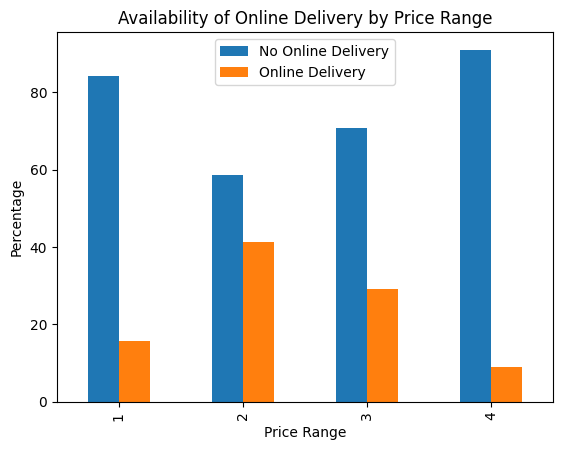

In [146]:
online_delivery_by_price_range.unstack().plot(kind='bar')
plt.title('Availability of Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Percentage')
plt.legend(['No Online Delivery', 'Online Delivery'])
plt.show()

#Task 2 : Price Range Analysis

#Determine the most common price range

In [147]:
most_common_price_range = df['Price range'].mode()[0]
print(f"The most common price range is: {most_common_price_range}")


The most common price range is: 1


#Calculate the average rating for each price range

In [148]:
avg_rating_by_price_range = df.groupby('Price range')['Aggregate rating'].mean()

print("\nAverage rating for each price range:")
print(avg_rating_by_price_range)


Average rating for each price range:
Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


#highest average rating among different price ranges.

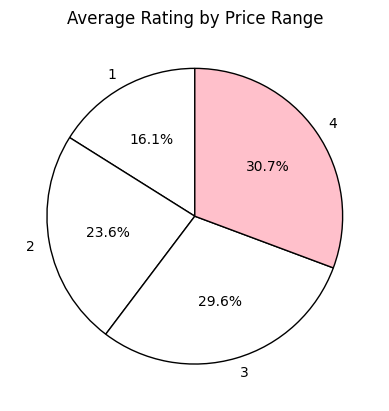

Highest Average Rating Price Range: 4


In [149]:
avg_rating_by_price_range = df.groupby('Price range')['Aggregate rating'].mean()
highest_avg_rating_range = avg_rating_by_price_range.idxmax()

# Create a pie chart with the highest average rating highlighted
colors = ['pink' if range == highest_avg_rating_range else 'white' for range in avg_rating_by_price_range.index]

plt.pie(avg_rating_by_price_range, labels=avg_rating_by_price_range.index, autopct='%1.1f%%', startangle=90, colors=colors,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})

plt.title('Average Rating by Price Range')
plt.show()

print(f"Highest Average Rating Price Range: {highest_avg_rating_range}")

#Task 3 : Feature Engineering

In [150]:
# 1. Length of restaurant name
df['Name_Length'] = df['Restaurant Name'].apply(len)

In [151]:
# 2. Length of restaurant address
df['Address_Length'] = df['Address'].apply(len)

#Create new binary features

In [152]:
# 1. Has Table Booking
df['Has_Table_Booking'] = df['Has Table booking'].apply(lambda x: 1 if x == 'Yes' else 0)

In [153]:
# 2. Has Online Delivery
df['Has_Online_Delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

In [154]:
# Print the first few rows of the modified DataFrame
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

# **LEVEL 3**

# Task 1: Predictive Modeling

In [155]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,r2_score

In [156]:
# Drop non-numeric columns that cannot be converted or are irrelevant for regression
non_numeric_cols = ['Restaurant ID', 'Restaurant Name', 'Address', 'Locality', 'Latitude', 'Longitude', 'Currency', 'Rating color', 'Rating text']  # Columns not suitable for regression

data_cleaned = df.drop(non_numeric_cols, axis=1)  # Drop non-numeric columns

# Perform one-hot encoding for remaining categorical columns
data_encoded = pd.get_dummies(data_cleaned, drop_first=True)

X = data_encoded.drop('Aggregate rating', axis=1)  # Features
# Target variable
y = df['Aggregate rating']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Model training and evaluation

In [157]:
# 1. Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_predictions = lr_model.predict(X_test)

# 2. Decision Tree Regression
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)
dt_predictions = dt_model.predict(X_test)

# 3. Random Forest Regression
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)

# Evaluate models

In [158]:
def evaluate_model(y_true,y_pred):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}")

print("Linear Regression:")
evaluate_model(y_test, lr_predictions)

print("\nDecision Tree Regression:")
evaluate_model(y_test, dt_predictions)

print("\nRandom Forest Regression:")
evaluate_model(y_test, rf_predictions)

Linear Regression:
Mean Squared Error: 68322328868289.55
R-squared Score: -30017160495902.90

Decision Tree Regression:
Mean Squared Error: 0.16
R-squared Score: 0.93

Random Forest Regression:
Mean Squared Error: 0.09
R-squared Score: 0.96


#Task2 : Customer Preference Analysis

In [159]:
import pandas as pd
# 1. Relationship between Cuisine Type and Rating
# Group by cuisine and calculate average rating
cuisine_rating = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

print("Average rating for each cuisine:")
print(cuisine_rating)

# 2. Most Popular Cuisines
# Group by cuisine and sum up the votes
popular_cuisines = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False).head(10)

print("\nTop 10 popular cuisines based on votes:")
print(popular_cuisines)

# 3. High-Rated Cuisines
# Identify cuisines with an average rating above a certain threshold (e.g., 4.5)
high_rated_cuisines = cuisine_rating[cuisine_rating > 4.5]

print("\nCuisines with higher ratings (average rating > 4.5):")
print(high_rated_cuisines)

Average rating for each cuisine:
Cuisines
American, Coffee and Tea             4.9
American, Caribbean, Seafood         4.9
BBQ, Breakfast, Southern             4.9
European, Asian, Indian              4.9
American, Sandwich, Tea              4.9
                                    ... 
Bakery, Healthy Food                 0.0
Continental, Italian, Fast Food      0.0
Lebanese, North Indian, Fast Food    0.0
Pizza, Burger, Fast Food             0.0
Pizza, Fast Food, Bakery             0.0
Name: Aggregate rating, Length: 1826, dtype: float64

Top 10 popular cuisines based on votes:
Cuisines
North Indian, Mughlai             53747
North Indian                      46241
North Indian, Chinese             42012
Cafe                              30657
Chinese                           21925
North Indian, Mughlai, Chinese    20115
Fast Food                         17852
South Indian                      16433
Mughlai, North Indian             15275
Italian                           14799
Name

#Task 3 : Data Visualization

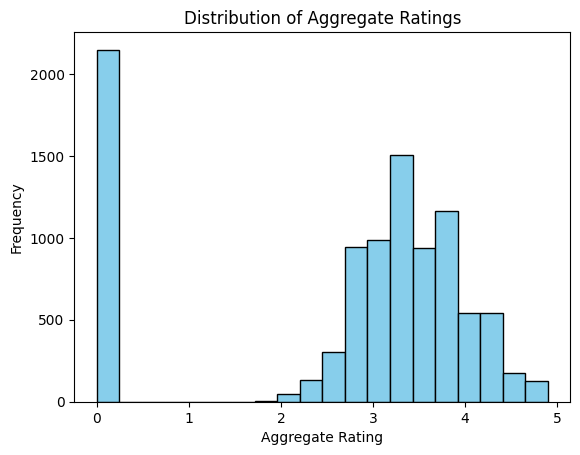

In [160]:
# 1. Distribution of Ratings
plt.hist(df['Aggregate rating'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Aggregate Ratings')
plt.show()

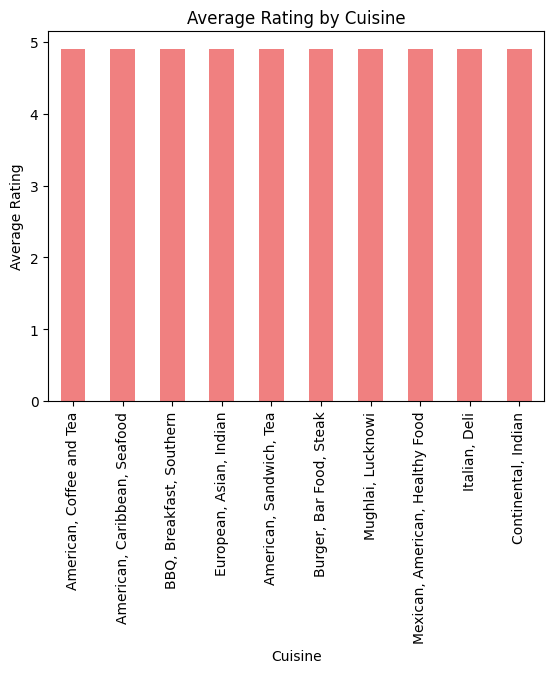

In [161]:
# 2. Average Ratings by Cuisine
cuisine_ratings = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
highest_cuisine_ratings   = cuisine_ratings.head(10)
highest_cuisine_ratings.plot(kind='bar',color='lightcoral')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.title('Average Rating by Cuisine')
plt.xticks(rotation=90)
plt.show()

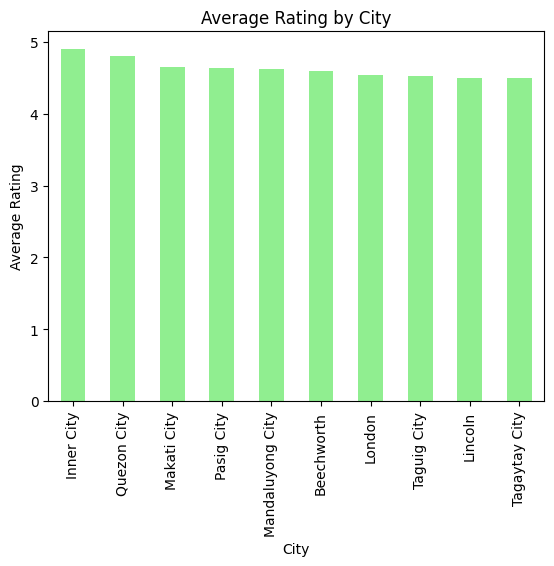

In [162]:
# 3. Average Ratings by City
city_ratings = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
highest_city_ratings   = city_ratings.head(10)
highest_city_ratings.plot(kind='bar', color='lightgreen')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.title('Average Rating by City')
plt.xticks(rotation=90)
plt.show()

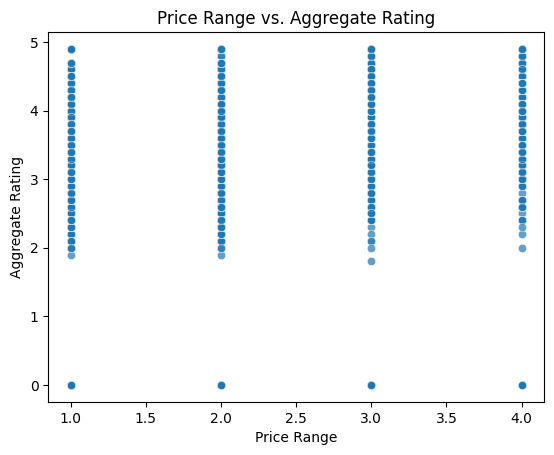

In [163]:
# 4. Relationship between Price Range and Rating
sns.scatterplot(x='Price range', y='Aggregate rating', data=df, alpha=0.7)
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.title('Price Range vs. Aggregate Rating')
plt.show()